## Necesary imports for the API

In [1]:
import pandas as pd
import numpy as np

import requests
import json
import datetime
from time import sleep
from IPython.display import Image
import random

### Function 1 - Check the available dates in the NASA EPIC API

In [2]:
def dates():
    dates_url = "https://epic.gsfc.nasa.gov/api/images.php?available_dates"
    dates_res = requests.get(dates_url)
    dates_res_json = dates_res.json()
    return print(dates_res_json)

### Functions 2 & 3 - Obtaining URLs based in user's input

In [3]:
def get_date():
    day_input=input("Enter a date in YYYY/MM/DD: ")
    date_input=datetime.datetime.strptime(day_input,"%Y-%m-%d").date()
    return date_input

def get_url():
    date = get_date()
    url_list = []
    for i in range(20,0,-1):
        url = f'https://epic.gsfc.nasa.gov/api/natural/date/{date.year}-{date.month}-{date.day-i}'
        url_list.append(url)
    return url_list

In [4]:
get_url()

Enter a date in YYYY/MM/DD: 2018-11-30


['https://epic.gsfc.nasa.gov/api/natural/date/2018-11-10',
 'https://epic.gsfc.nasa.gov/api/natural/date/2018-11-11',
 'https://epic.gsfc.nasa.gov/api/natural/date/2018-11-12',
 'https://epic.gsfc.nasa.gov/api/natural/date/2018-11-13',
 'https://epic.gsfc.nasa.gov/api/natural/date/2018-11-14',
 'https://epic.gsfc.nasa.gov/api/natural/date/2018-11-15',
 'https://epic.gsfc.nasa.gov/api/natural/date/2018-11-16',
 'https://epic.gsfc.nasa.gov/api/natural/date/2018-11-17',
 'https://epic.gsfc.nasa.gov/api/natural/date/2018-11-18',
 'https://epic.gsfc.nasa.gov/api/natural/date/2018-11-19',
 'https://epic.gsfc.nasa.gov/api/natural/date/2018-11-20',
 'https://epic.gsfc.nasa.gov/api/natural/date/2018-11-21',
 'https://epic.gsfc.nasa.gov/api/natural/date/2018-11-22',
 'https://epic.gsfc.nasa.gov/api/natural/date/2018-11-23',
 'https://epic.gsfc.nasa.gov/api/natural/date/2018-11-24',
 'https://epic.gsfc.nasa.gov/api/natural/date/2018-11-25',
 'https://epic.gsfc.nasa.gov/api/natural/date/2018-11-26

### Functions 4 & 5 - Obtaining API data, rearranging it to DataFrame and displaying 3 sample images

In [9]:
def get_data():
    empty_list = []
    url_list = get_url()
    dates_array = []
    for i in url_list:
        sleep(2)
        res = requests.get(i)
        res_json = res.json()

        day_info = []
        for i in range(0,len(res_json)):
            temp_list = []
            identifier = res_json[i]["identifier"]
            caption = res_json[i]["caption"]
            img_id = res_json[i]["image"]
            lat = res_json[i]["centroid_coordinates"]["lat"]
            lon = res_json[i]["centroid_coordinates"]["lon"]
            date = res_json[i]["date"][0:10]
            date_yr = date[0:4]
            date_mth = date[5:7]
            date_day = date[8:10]
            temp_list.append(identifier)
            temp_list.append(caption)
            temp_list.append(img_id)
            temp_list.append(lat)
            temp_list.append(lon)
            temp_list.append(date)
            temp_list.append(date_yr)
            temp_list.append(date_mth)
            temp_list.append(date_day)
            day_info.append(temp_list)
        dates_array.append(day_info)
    for i in dates_array:
        for j in i:
            empty_list.append(j)
    df = pd.DataFrame(empty_list, columns=["NASA_Identifier","Caption","Image_ID","Latitude","Longitude","Date",
                                     "Year","Month","Day"])   
    return df

def img_links(df):
    links = []
    for row in range(0,len(df)):
        Year = df['Year'][row]
        Month = df['Month'][row]
        Day = df['Day'][row]
        Image_ID = df['Image_ID'][row]
        string = f'https://epic.gsfc.nasa.gov/archive/natural/{Year}/{Month}/{Day}/png/{Image_ID}.png'
        links.append(string)
    df['Image_links'] = links
    return df
        
def NASA_EPIC_API():
    print("Gathering data from EPIC website based on your input below:")
    return img_links(get_data())
    

In [10]:
NASA_EPIC_API()

Gathering data from EPIC website based on your input below:
Enter a date in YYYY/MM/DD: 2018-11-30


,NASA_Identifier,Caption,Image_ID,Latitude,Longitude,Date,Year,Month,Day,Image_links
0,20181110005515,This image was taken by NASA's EPIC camera onb...,epic_1b_20181110005515,-13.366699,172.053223,2018-11-10,2018,11,10,https://epic.gsfc.nasa.gov/archive/natural/201...
1,20181110024318,This image was taken by NASA's EPIC camera onb...,epic_1b_20181110024318,-13.395996,145.100098,2018-11-10,2018,11,10,https://epic.gsfc.nasa.gov/archive/natural/201...
2,20181110043121,This image was taken by NASA's EPIC camera onb...,epic_1b_20181110043121,-13.425293,118.081055,2018-11-10,2018,11,10,https://epic.gsfc.nasa.gov/archive/natural/201...
3,20181110061924,This image was taken by NASA's EPIC camera onb...,epic_1b_20181110061924,-13.454590,91.179199,2018-11-10,2018,11,10,https://epic.gsfc.nasa.gov/archive/natural/201...
4,20181110080727,This image was taken by NASA's EPIC camera onb...,epic_1b_20181110080727,-13.469238,64.116211,2018-11-10,2018,11,10,https://epic.gsfc.nasa.gov/archive/natural/201...
...,...,...,...,...,...,...,...,...,...,...
232,20181129061003,This image was taken by NASA's EPIC camera onb...,epic_1b_20181129061003,-20.302734,95.493164,2018-11-29,2018,11,29,https://epic.gsfc.nasa.gov/archive/natural/201...
233,20181129075806,This image was taken by NASA's EPIC camera onb...,epic_1b_20181129075806,-20.346680,68.488770,2018-11-29,2018,11,29,https://epic.gsfc.nasa.gov/archive/natural/201...
234,20181129094608,This image was taken by NASA's EPIC camera onb...,epic_1b_20181129094608,-20.346680,41.440430,2018-11-29,2018,11,29,https://epic.gsfc.nasa.gov/archive/natural/201...
235,20181129113345,This image was taken by NASA's EPIC camera onb...,epic_1b_20181129113345,-20.397949,14.582520,2018-11-29,2018,11,29,https://epic.gsfc.nasa.gov/archive/natural/201...


In [13]:
def display_sample_img():
    df = img_links(get_data())
    for i in range(0,3):
        a = random.randint(0,9)
        display(Image(df['Image_links'][a]))

Enter a date in YYYY/MM/DD: 2018-11-30


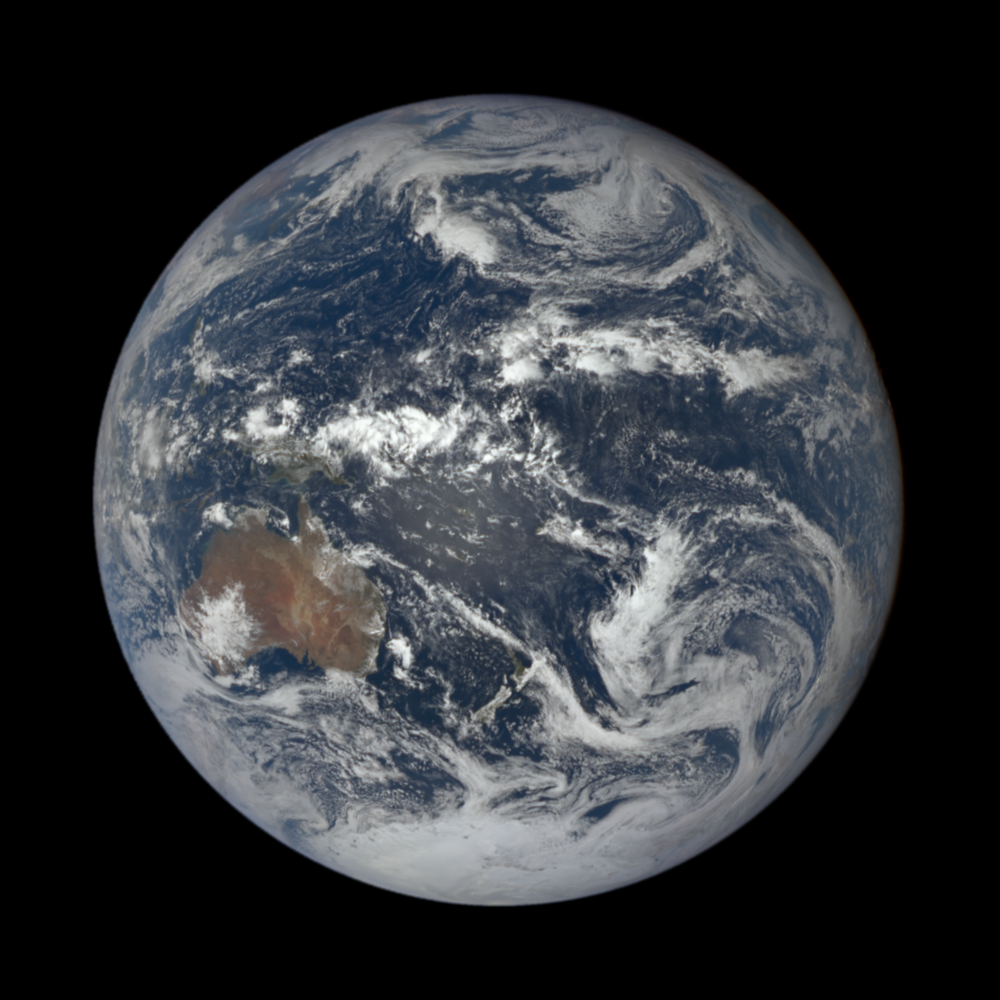

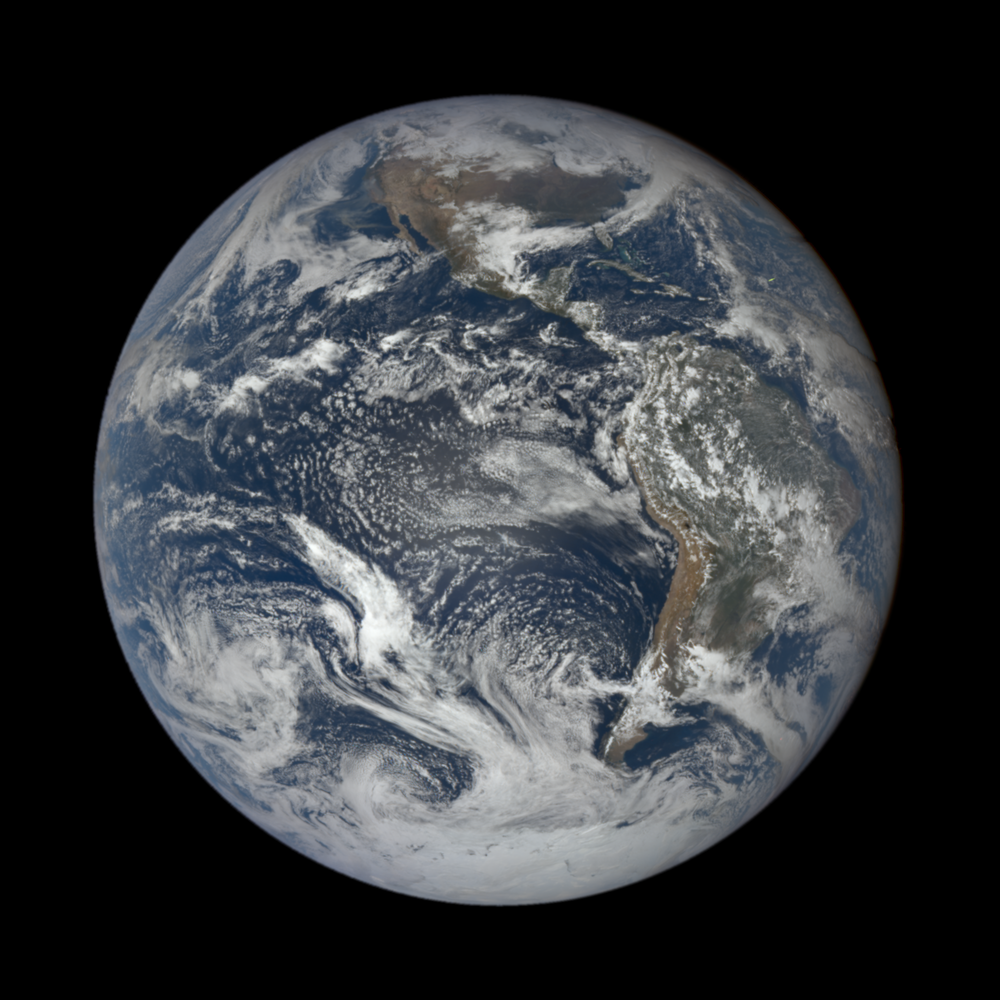

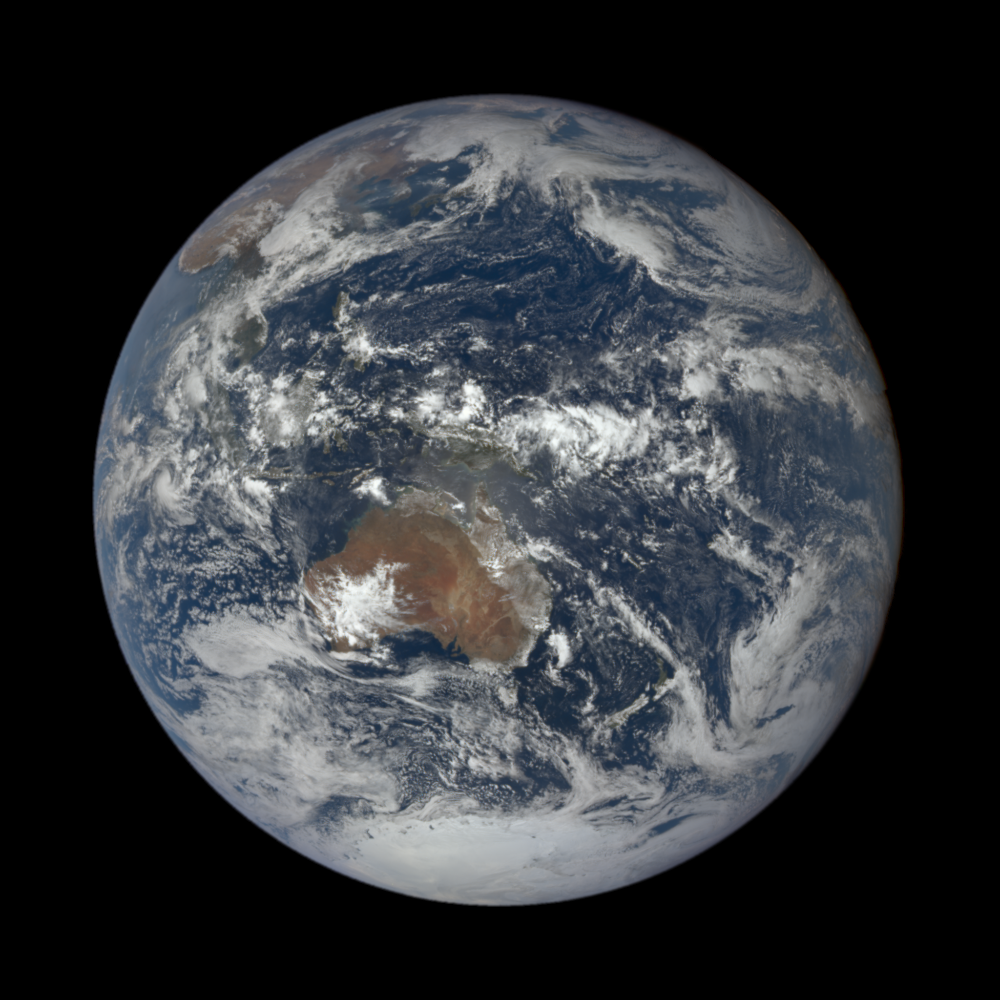

In [14]:
display_sample_img()